<h1>初始化</h1>

In [1]:
import trimesh
from torch.utils.cpp_extension import load
import torch
from tqdm import trange
import numpy as np
import cv2
import os
import matplotlib.pyplot as plt
import open3d as o3d
import pymeshlab
from math import acos
from SpaceCarving import SpaceCarving

#增加图像对比度
def EnhanceImage(Img):
    ImgT = cv2.cvtColor(Img,cv2.COLOR_BGR2HSV)
    H, S, V = cv2.split(ImgT)
    #增加图像对比度
    V2 = np.clip(cv2.add(3*V,20),0,255)
    ImgNew = np.uint8(cv2.merge((H,S,V2)))
    ImgNew = cv2.cvtColor(ImgNew,cv2.COLOR_HSV2BGR)
    return ImgNew

#根据平移向量求得平移矩阵
def TranslateMatrix(Vector):
    T = np.eye(4, dtype=np.float64)
    T[0:3, 3] = Vector.squeeze()
    T[3, 3] = 1.
    return T

#根据旋转向量求得旋转矩阵
def RotateMatrix(Axis, Theta, Origin = None):
    R = np.eye(4, dtype=np.float64)
    R[0:3, 0:3] = cv2.Rodrigues(Axis*Theta)[0]
    if (type(Origin) != type(None)):
        R = TranslateMatrix(Origin)@R@TranslateMatrix(-Origin)
    return R

#根据旋转向量和平移向量计算外参
def GetExtrinsics(Rvec, Tvec):
    Rvec = Rvec.squeeze()
    Tvec = Tvec.squeeze()
    RMatrix, _ = cv2.Rodrigues(Rvec)
    Extrinsics = np.eye(4, dtype=np.float64)
    Extrinsics[0:3, 0:3] = RMatrix
    Extrinsics[0:3, 3] = Tvec
    return Extrinsics

#取三点求圆心
def GetCenterAndRadius(P1, P2, P3):
    x1, y1, z1 = P1
    x2, y2, z2 = P2
    x3, y3, z3 = P3
    D1 = -x1*y2*z3+x1*y3*z2+x2*y1*z3-x3*y1*z2-x2*y3*z1+x3*y2*z1
    A1 = y1*z2-y1*z3-z1*y2+z1*y3+y2*z3-y3*z2
    B1 = -x1*z2+x1*z3+z1*x2-z1*x3-x2*z3+x3*z2
    C1 = x1*y2-x1*y3-y1*x2+y1*x3+x2*y3-x3*y2
    D2 = np.sum(np.square(P1))-np.sum(np.square(P2))
    A2 = 2*(x2-x1)
    B2 = 2*(y2-y1)
    C2 = 2*(z2-z1)
    D3 = np.sum(np.square(P1))-np.sum(np.square(P3))
    A3 = 2*(x3-x1)
    B3 = 2*(y3-y1)
    C3 = 2*(z3-z1)
    Center = -np.linalg.inv(np.array([[A1,B1,C1],[A2,B2,C2],[A3,B3,C3]]))@np.array([[D1],[D2],[D3]]).squeeze()
    R = np.linalg.norm(P1-Center)
    Axis = np.cross(P1-Center, P3-Center)
    Angle = acos(np.dot(P1-Center, P3-Center)/np.linalg.norm(P1-Center)/np.linalg.norm(P3-Center))
    Axis = Axis / np.linalg.norm(Axis)
    return Center, R, Axis, Angle

#将Object编码为字节
def GetBytes(Object, NumBytes = 4):
    if (type(Object) == int):
        return Object.to_bytes(NumBytes, "little")
    if (type(Object) == str):
        return str.encode(Object)
    assert False

#导出为Vox文件
def ExportVox(FileName, Voxels, Colors):
    with open(FileName, 'wb') as BinFile:
        MaxCoord = np.max(Voxels, axis=0)+1
        MaxX, MaxY, MaxZ = int(MaxCoord[0]), int(MaxCoord[1]), int(MaxCoord[2])
        NumVoxels = Voxels.shape[0]
        #统计颜色出现频率
        if not (Colors is None):
            print("Simplifying colors and Exporting voxels...")
            ColorHex = ((Colors[:, 0]&0xfc)<<10)|((Colors[:, 1]&0xfc)<<4)|((Colors[:, 2]&0xfc)>>2)
            Count = np.bincount(ColorHex)
            Frequency = np.zeros(Count.shape[0], dtype=[("Index", np.uint32),("Count", np.uint32)])
            Frequency["Index"] = np.arange(Count.shape[0], dtype=np.uint32)
            Frequency["Count"] = Count
            Frequency = np.sort(Frequency, order="Count")[::-1]
            Highest255 = Frequency["Index"][0:255]
            #确定调色板颜色
            ColorList = np.zeros(256, dtype=np.uint32)
            ColorPoint = np.zeros((255, 3), dtype=np.uint32)
            ColorPoint[:, 0] = ((Highest255&0x3f000) >> 10) | 0x3
            ColorPoint[:, 1] = ((Highest255&0xfc0) >> 4) | 0x3
            ColorPoint[:, 2] = ((Highest255&0x3f) << 2) | 0x3
            ColorList[1:256] = 0xff000000|(ColorPoint[:, 2]<<16)|(ColorPoint[:, 1]<<8)|(ColorPoint[:, 0])
            #把RGB颜色转换为256色编号
            ColorIndex = np.zeros(NumVoxels, dtype=int)
            for i in trange(NumVoxels):
                ColorIndex[i] = np.argmin(np.sum(np.square((Colors[i]-ColorPoint)),axis=1))+1
        else:
            print("Exporting voxels...")
            ColorList = np.zeros(256, dtype=np.uint32)
            ColorList[1:256] = 0xffffffff
            ColorIndex = np.ones(NumVoxels, dtype=int)
        #写入文件
        BinFile.write(GetBytes("VOX "))
        BinFile.write(GetBytes(150))
        BinFile.write(GetBytes("MAIN"))
        BinFile.write(GetBytes(0)) #MAIN的content长度
        BinFile.write(GetBytes(1076+NumVoxels*4)) #MAIN的child chunk长度, (SIZE)12+12  +(XYZI)12+NumVoxels*4+4  +(RGBA)12+1024
        BinFile.write(GetBytes("SIZE"))
        BinFile.write(GetBytes(12)) #SIZE的content长度
        BinFile.write(GetBytes(0))  #SIZE的child chunk长度
        BinFile.write(GetBytes(MaxX))  #x方向的长度
        BinFile.write(GetBytes(MaxY))  #y方向的长度
        BinFile.write(GetBytes(MaxZ))  #z方向的长度
        BinFile.write(GetBytes("XYZI"))
        BinFile.write(GetBytes(NumVoxels*4+4)) #XYZI的content长度
        BinFile.write(GetBytes(0))  #XYZI的child chunk长度
        BinFile.write(GetBytes(NumVoxels)) #体素个数
        for i in trange(NumVoxels):
            BinFile.write(GetBytes(int(Voxels[i, 0]), 1))
            BinFile.write(GetBytes(int(Voxels[i, 1]), 1))
            BinFile.write(GetBytes(int(Voxels[i, 2]), 1))
            BinFile.write(GetBytes(int(ColorIndex[i]), 1))
        BinFile.write(GetBytes("RGBA"))
        BinFile.write(GetBytes(1024)) #RGBA的content长度
        BinFile.write(GetBytes(0))    #RGBA的child chunk长度
        for i in ColorList[1:]:
            BinFile.write(GetBytes(int(i)))
        BinFile.write(GetBytes(0))
        BinFile.close()

#相机校正
def CalibrateCamera(CameraCalibrationPath, PointsShape, SquareSize, Flags):
    #人为设置世界坐标系中点的坐标
    ObjP = np.zeros((np.prod(PointsShape),3), dtype=np.float32)
    ObjP[:,:2] = np.mgrid[0:PointsShape[0], 0:PointsShape[1]].T.reshape(-1,2)
    ObjP *= SquareSize
    #定义点的坐标
    ObjPoints = []  #世界坐标系中点的坐标
    ImgPoints = []  #相机拍摄图中点的位置
    #枚举每一张图
    i = 0
    while (True):
        i += 1
        if not os.path.isfile(CameraCalibrationPath+(str(i) if i>=10 else "0"+str(i))+".bmp"):
            i -= 1
            break
        #加载图片
        IMG = cv2.imread(CameraCalibrationPath+(str(i) if i>=10 else "0"+str(i))+".bmp")
        print("Loading "+(str(i) if i>=10 else "0"+str(i))+"-th picture.")
        GrayIMG = cv2.cvtColor(IMG, cv2.COLOR_BGR2GRAY)
        #找点坐标
        Ret, Corners = cv2.findChessboardCorners(GrayIMG, PointsShape, None)
        if (Ret) == True:
            print("Chessboard detected for "+(str(i) if i>=10 else "0"+str(i))+"-th picture.")
            Criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 30, 0.001)
            cv2.cornerSubPix(GrayIMG, Corners, (5,5), (-1,-1), Criteria)
            ObjPoints.append(ObjP)
            ImgPoints.append(Corners)
        else:
            print("Fail to detect chessboard for "+(str(i) if i>=10 else "0"+str(i))+"-th picture.")
            assert False
        print()
    print("Detected "+(str(i) if i>=10 else "0"+str(i))+" pictures.")
    #校准相机、计算相机参数
    ImgShape = GrayIMG.shape[::-1]
    Ret, K, Dist, _, _ = cv2.calibrateCamera(ObjPoints, ImgPoints, ImgShape, None, None, None, None, Flags)
    return K, Dist, ImgShape

#转盘校正
def CalibrateTurnplate(TurnplateCalibrationPath, PointsShape, SquareSize, K, Dist, StartPositionIndex, RotateAngle):
    #人为设置世界坐标系中点的坐标
    ObjP = np.zeros((np.prod(PointsShape),3), dtype=np.float32)
    ObjP[:,:2] = np.mgrid[0:PointsShape[0], 0:PointsShape[1]].T.reshape(-1,2)
    ObjP *= SquareSize
    #定义点的坐标
    ObjPoints = []  #世界坐标系中点的坐标
    ImgPoints = []  #相机拍摄图中点的位置
    CameraPos = []  #相机的位置
    Extrinsics = [] #相机的外参
    #枚举每一张图
    i = 0
    while (True):
        i += 1
        if not os.path.isfile(TurnplateCalibrationPath+(str(i) if i>=10 else "0"+str(i))+".bmp"):
            i -= 1
            break
        #加载图片
        IMG = cv2.imread(TurnplateCalibrationPath+(str(i) if i>=10 else "0"+str(i))+".bmp")
        print("Loading "+(str(i) if i>=10 else "0"+str(i))+"-th picture.")
        GrayIMG = cv2.cvtColor(IMG, cv2.COLOR_BGR2GRAY)
        #找点坐标
        Ret, Corners = cv2.findChessboardCorners(GrayIMG, PointsShape, None)
        if (Ret) == True:
            print("Chessboard detected for "+(str(i) if i>=10 else "0"+str(i))+"-th picture.")
            Criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 30, 0.001)
            cv2.cornerSubPix(GrayIMG, Corners, (5,5), (-1,-1), Criteria)
            Ret, Rvec, Tvec = cv2.solvePnP(ObjP, Corners, K, Dist)
            Extrinsics.append(GetExtrinsics(Rvec, Tvec))
            CameraPos.append(np.linalg.inv(Extrinsics[-1])[0:3, 3])
        else:
            print("Fail to detect chessboard for "+(str(i) if i>=10 else "0"+str(i))+"-th picture.")
            assert False
        print()
    print("Detected "+(str(i) if i>=10 else "0"+str(i))+" pictures.")
    #根据相机位置计算圆心、旋转轴
    Center, _, Axis, Angle = GetCenterAndRadius(CameraPos[0], CameraPos[i//2], CameraPos[-1])
    Angle /= (i-1)
    Axis = -Axis
    #然后计算72个视角的相机外参
    Rvec = []
    Tvec = []
    Ext = []
    InvExt = []
    Angle = RotateAngle
    for i in range(72):
        Ext.append(Extrinsics[StartPositionIndex-1]@RotateMatrix(Axis, i*Angle, Center))
        Rvec.append(cv2.Rodrigues(Ext[-1][0:3, 0:3])[0])
        Tvec.append(Ext[-1][0:3, 3:4])
        InvExt.append(np.linalg.inv(Ext[-1]))
    Rvec = np.array(Rvec)
    Tvec = np.array(Tvec)
    Ext = np.array(Ext)
    InvExt = np.array(InvExt)
    return Rvec, Tvec, Ext, InvExt

#输入两张图片, 显示屏分别投全黑图和全白图. 对比两张图, 亮度没有明显变化的就是物体的Silhouette
def ExtractSilhouette(IMG1, IMG2, Diff, Hollow=True):
    #计算亮度
    if (IMG2 is None):
        Bright = cv2.cvtColor(IMG1, cv2.COLOR_BGR2HLS)[:, :, 1]
        Sihouette = Bright >= Diff
    else:
        Bright1 = cv2.cvtColor(IMG1, cv2.COLOR_BGR2HLS)[:, :, 1].astype(np.int32)
        Bright2 = cv2.cvtColor(IMG2, cv2.COLOR_BGR2HLS)[:, :, 1].astype(np.int32)
        #和显示器的两次亮度变化相比, 物体的亮度应该基本保持不变
        Sihouette = np.absolute(Bright1 - Bright2) < Diff
    #仅保留最大面积连通区域
    Contours, Hierarchy = cv2.findContours(Sihouette.astype(np.uint8)*255, cv2.RETR_CCOMP, cv2.CHAIN_APPROX_SIMPLE)
    #计算面积
    Area = [0] * len(Contours)
    for i in range(len(Contours)):
        if (Hierarchy[0][i][3] != -1):
            continue
        Area[i] = cv2.contourArea(Contours[i])
        if (not Hollow):
            continue
        j = Hierarchy[0][i][2]
        while (j != -1):
            Area[i] -= cv2.contourArea(Contours[j])
            j = Hierarchy[0][j][0]
    ArgmaxArea = np.argmax(Area)
    Sihouette = cv2.drawContours(np.zeros(np.array(IMG1).shape[0:2], dtype=np.uint8), Contours, ArgmaxArea, 255, -1)
    if (not Hollow):
        return Sihouette
    j = Hierarchy[0][ArgmaxArea][2]
    while (j != -1):
        Sihouette = cv2.drawContours(Sihouette, Contours, j, 0, -1)
        j = Hierarchy[0][j][0]
    return Sihouette

#将不合法的点云删去
def MaskPointCloud(Vertices, Mask, K, Dist):
    Projections = cv2.projectPoints(Vertices, np.array([0., 0., 0.]), np.array([0., 0., 0.]), K, Dist)[0].squeeze()
    Valid1 = np.logical_and(Projections[:, 0] < Mask.shape[1], Projections[:, 1] < Mask.shape[0])
    Valid2 = np.logical_and(Projections[:, 0] >= 0, Projections[:, 1] >= 0)
    Valid = np.logical_and(Valid1, Valid2)
    Projections[np.logical_not(Valid), :] = [0., 0.]
    Projections = np.round(Projections).astype(int)
    Valid = np.logical_and(Valid, Mask[Projections[:, 1], Projections[:, 0]])
    return np.nonzero(Valid)[0]
    

ModuleNotFoundError: No module named 'open3d'

<h1>参数设置</h1>

In [105]:
#根目录, 下面的一切路径都在根目录内
"""RootPath = "./Bread/""""
RootPath = "./Skeleton/"


#设置校准相机用的图片目录
#图片命名标准：
#CameraCalibrationPath目录内：01.bmp, 02.bmp, 03.bmp, ...
CameraCalibrationPath = "TurnplateCalibrate/"
#定义图案参数
PointsShape = (9, 6)
SquareSize = 1.93


#保存参数的路径
ParamSavePath = "CameraParams.npz"


#设置校准转盘用的图片目录
#图片命名标准：
#TurnplateCalibrationPath目录内：01.bmp, 02.bmp, 03.bmp, ...
TurnplateCalibrationPath = "TurnplateCalibrate/"
#定义图案参数
PointsShape = (9, 6)
SquareSize = 1.93
#参考位置编号, 从1开始. 算法将使用StartPos所指定的图片所对应的外参，作为SpaceCarving的坐标系
StartPos = 8
#旋转角度
"""RotateAngle = 5.21*3.141592653589793/180"""
RotateAngle = 5.714*3.141592653589793/180


#轮廓提取照片的路径
#图片命名标准：
#CapturePath1和CapturePath2目录内：01.bmp, 02.bmp, 03.bmp, ..., 72.bmp
CapturePath1 = "CaptureBlack/"
CapturePath2 = "CaptureWhite/"
#为了过滤噪音, 我们只选取图片的一小部分提取轮廓. 请保证这一部分能完全覆盖72个视角上的物体轮廓
"""Up = 725
Down = 1125
Left = 650
Right = 1600"""
Up = 150
Down = 1020
Left = 450
Right = 1450
#对比阀值, 判断亮度差异, 不超过这个值就认为在物体轮廓内部
"""Threshold = 30"""
Threshold = 100
#如果要从外部读取轮廓图, 请设置读取的目录
MaskPath = "Mask/"
#如果要把算法算出的轮廓导出, 请设为True
ExportMask = True


#Optix目录
optix_include = "/home/jjyou/sdb3/jjyou/WorkSpace/NVIDIA-OptiX-SDK-6.5.0-linux64/include"
optix_ld = "/home/jjyou/sdb3/jjyou/WorkSpace/NVIDIA-OptiX-SDK-6.5.0-linux64/lib64"
#初始化optix
optix = load(name="optix",
             sources=["./optix_extend.cpp"],
             extra_include_paths=[optix_include],
             extra_ldflags=["-L"+optix_ld, "-loptix_prime"])
optix_mesh = optix.optix_mesh(0)


#导出的文件路径
ExportPath = "Result.vox"


#点云文件夹
#点云命名标准：
#PointCloudPath目录内：View01.ply, View10.ply, View19.ply, ...
PointCloudPath = "PointCloud/"
PointCloudViews = [1, 10, 64]


#投影仪&相机参数yml文件
YMLPath = "calibration.yml"


#是否使用投影法来确定颜色
UseProjectionColor = False
#颜色图片目录
#图片命名标准：
#PointCloudPath目录内：01.bmp, 10.bmp, 19.bmp, ...
ColorPath = "ColorImages/"
ColorViews = [1, 10, 19, 28, 37, 46, 55, 64]

<h1>相机校正</h1>

In [51]:
#相机校正
K, Dist, ImgShape = CalibrateCamera(RootPath+CameraCalibrationPath, PointsShape, SquareSize, 0)
#保存参数
np.savez(RootPath+ParamSavePath, K=K, Dist=Dist, ImgShape=ImgShape)
print()
print("Intrinsics:")
print(K)
print("Distortion:")
print(Dist)

Loading 01-th picture.
Chessboard detected for 01-th picture.

Loading 02-th picture.
Chessboard detected for 02-th picture.

Loading 03-th picture.
Chessboard detected for 03-th picture.

Loading 04-th picture.
Chessboard detected for 04-th picture.

Loading 05-th picture.
Chessboard detected for 05-th picture.

Loading 06-th picture.
Chessboard detected for 06-th picture.

Loading 07-th picture.
Chessboard detected for 07-th picture.

Loading 08-th picture.
Chessboard detected for 08-th picture.

Loading 09-th picture.
Chessboard detected for 09-th picture.

Loading 10-th picture.
Chessboard detected for 10-th picture.

Loading 11-th picture.
Chessboard detected for 11-th picture.

Loading 12-th picture.
Chessboard detected for 12-th picture.

Loading 13-th picture.
Chessboard detected for 13-th picture.

Loading 14-th picture.
Chessboard detected for 14-th picture.

Loading 15-th picture.
Chessboard detected for 15-th picture.

Detected 15 pictures.

Intrinsics:
[[3.68921316e+03 0.0

In [18]:
#加载相机参数
CameraParams = np.load(RootPath+ParamSavePath)
K = CameraParams["K"]
Dist = CameraParams["Dist"]
ImgShape = CameraParams["ImgShape"]

<h1>转盘校正</h1>

In [59]:
Rvec, Tvec, Ext, InvExt = CalibrateTurnplate(RootPath+TurnplateCalibrationPath, PointsShape, SquareSize, K, Dist, StartPos, RotateAngle)

Loading 01-th picture.
Chessboard detected for 01-th picture.

Loading 02-th picture.
Chessboard detected for 02-th picture.

Loading 03-th picture.
Chessboard detected for 03-th picture.

Loading 04-th picture.
Chessboard detected for 04-th picture.

Loading 05-th picture.
Chessboard detected for 05-th picture.

Loading 06-th picture.
Chessboard detected for 06-th picture.

Loading 07-th picture.
Chessboard detected for 07-th picture.

Loading 08-th picture.
Chessboard detected for 08-th picture.

Loading 09-th picture.
Chessboard detected for 09-th picture.

Loading 10-th picture.
Chessboard detected for 10-th picture.

Loading 11-th picture.
Chessboard detected for 11-th picture.

Loading 12-th picture.
Chessboard detected for 12-th picture.

Loading 13-th picture.
Chessboard detected for 13-th picture.

Loading 14-th picture.
Chessboard detected for 14-th picture.

Loading 15-th picture.
Chessboard detected for 15-th picture.

Detected 15 pictures.


<h1>提取轮廓方法1：一张白底图、一张黑底图，两张对比得到轮廓</h1>

/home/jjyou/anaconda3/envs/MyEnv/lib/python3.6/site-packages/ipykernel_launcher.py:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  
/home/jjyou/anaconda3/envs/MyEnv/lib/python3.6/site-packages/ipykernel_launcher.py:10: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  # Remove the CWD from sys.path while we load stuff.


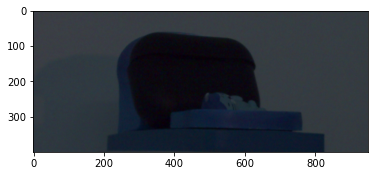

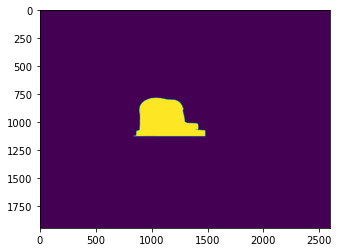

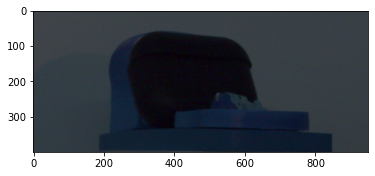

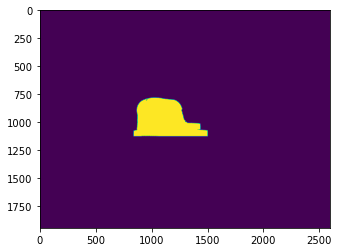

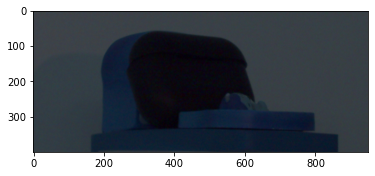

...

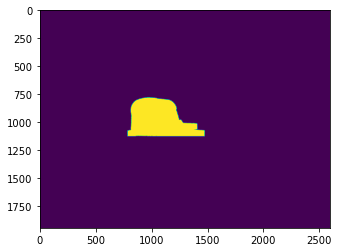

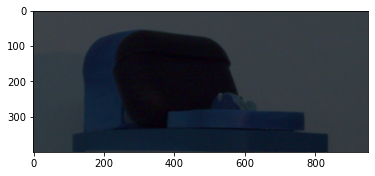

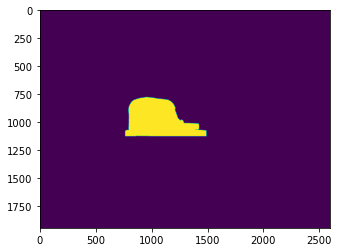

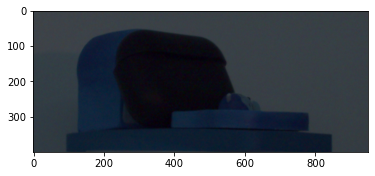

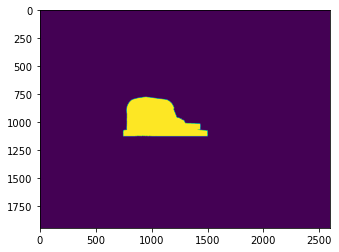

In [7]:
#提取轮廓
Mask = np.zeros((72,ImgShape[1],ImgShape[0]), dtype=np.uint8)
for i in range(1,73):
    IMG1 = cv2.imread(RootPath+CapturePath1+(str(i) if i>=10 else "0"+str(i))+".bmp")[Up:Down, Left:Right]
    IMG2 = cv2.imread(RootPath+CapturePath2+(str(i) if i>=10 else "0"+str(i))+".bmp")[Up:Down, Left:Right]
    Silhouette= ExtractSilhouette(IMG1, IMG2, Threshold, True)
    Mask[i-1][Up:Down, Left:Right] = Silhouette
    plt.figure()
    plt.imshow(IMG1)
    plt.figure()
    plt.imshow(Mask[i-1])
    if (ExportMask):
        cv2.imwrite(RootPath+MaskPath+str(i)+".bmp", Mask[i-1])

<h1>提取轮廓方法2：前景物体和背景亮度不同，在一张图片内对比得到轮廓</h1>

/home/jjyou/anaconda3/envs/MyEnv/lib/python3.6/site-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys
/home/jjyou/anaconda3/envs/MyEnv/lib/python3.6/site-packages/ipykernel_launcher.py:9: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  if __name__ == '__main__':


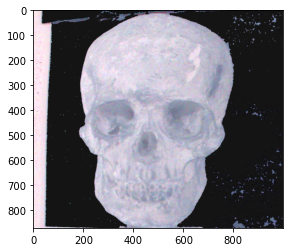

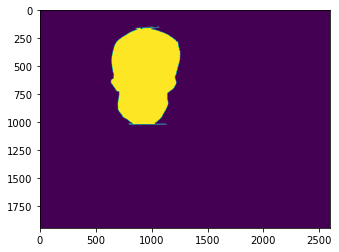

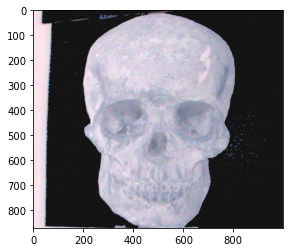

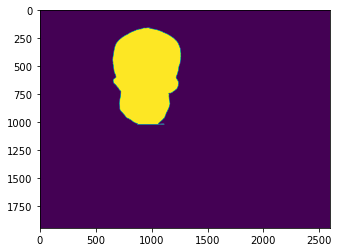

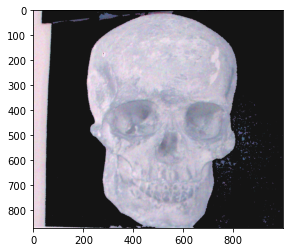

...

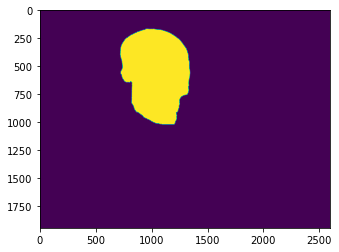

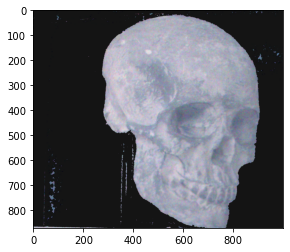

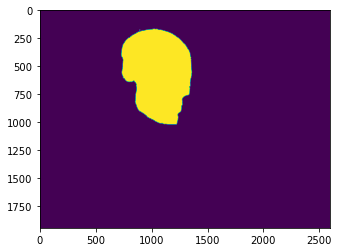

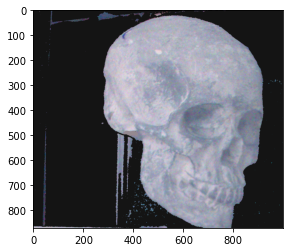

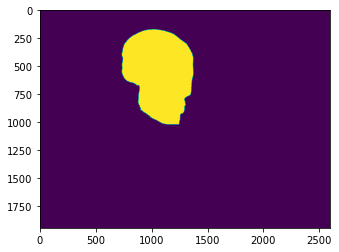

In [6]:
#提取轮廓
Mask = np.zeros((72,ImgShape[1],ImgShape[0]), dtype=np.uint8)
for i in range(1,73):
    IMG = EnhanceImage(cv2.imread(RootPath+CapturePath1+(str(i) if i>=10 else "0"+str(i))+".bmp")[Up:Down, Left:Right])
    Silhouette= ExtractSilhouette(IMG, None, Threshold, False)
    Mask[i-1][Up:Down, Left:Right] = Silhouette
    plt.figure()
    plt.imshow(IMG)
    plt.figure()
    plt.imshow(Mask[i-1])
    if (ExportMask):
        cv2.imwrite(RootPath+MaskPath+str(i)+".bmp", Mask[i-1])

<h1>提取轮廓方法3：从外部文件读取轮廓</h1>

In [10]:
#提取轮廓
Mask = np.zeros((72,ImgShape[1],ImgShape[0]), dtype=np.uint8)
for i in range(1,73):
    Mask[i-1] = cv2.imread(RootPath+MaskPath+str(i)+".bmp")[:, :, 0]
    assert (np.logical_or(Mask[i-1]==255, Mask[i-1]==0).all())

<h1>进行体素雕刻</h1>

In [101]:
#实例化Space Carving对象
SC = SpaceCarving(Rvec.shape[0], Rvec, Tvec, K, Dist, Mask//255)
"""SC.SetParam(VoxelSize = 0.5,
            Origin = [8.25, 1.75, -8.5],
            Xrange = 12.0,
            Yrange = 8.0,
            Zrange = 12.0)
"""
SC.SetParam(VoxelSize = 0.1,
            Origin = [10., 5., -10.],
            Xrange = 20,
            Yrange = 22.,
            Zrange = 20.)
#进行雕刻
Voxel = SC.Carve()
print("Min range:", np.min(Voxel, axis=0))
print("Max range:", np.max(Voxel, axis=0))

Before carving: 8800000 points.
1-th carving: 5136921 points.
2-th carving: 4906280 points.
3-th carving: 4696088 points.
4-th carving: 4504995 points.
5-th carving: 4330114 points.
6-th carving: 4167288 points.
7-th carving: 4035413 points.
8-th carving: 3853355 points.
9-th carving: 3691078 points.
10-th carving: 3559150 points.
11-th carving: 3432249 points.
12-th carving: 3301465 points.
13-th carving: 3151670 points.
14-th carving: 3020588 points.
15-th carving: 2876909 points.
16-th carving: 2740373 points.
17-th carving: 2626885 points.
18-th carving: 2569513 points.
19-th carving: 2516283 points.
20-th carving: 2481674 points.
21-th carving: 2454098 points.
22-th carving: 2431102 points.
23-th carving: 2410982 points.
24-th carving: 2394546 points.
25-th carving: 2376050 points.
26-th carving: 2362625 points.
27-th carving: 2349930 points.
28-th carving: 2340225 points.
29-th carving: 2333973 points.
30-th carving: 2323305 points.
31-th carving: 2321515 points.
32-th carving: 2

<h1>加载点云(深度图)</h1>

In [12]:
KK = np.array([ 3.5386559446846459e+003, 0., 1.1331690430784361e+003, 0.,
       3.5353806458882368e+003, 1.1607647665457878e+003, 0., 0., 1. ]).reshape((3,3))
for ViewIndex in PointCloudViews:
    PCD = o3d.io.read_point_cloud(RootPath+PointCloudPath+"View"+(str(ViewIndex) if ViewIndex>=10 else "0"+str(ViewIndex))+".ply")
    #根据物体轮廓, 清理点云
    Ind = MaskPointCloud(np.asarray(PCD.points), Mask[ViewIndex-1], K, Dist)
    PCDNew = PCD.select_down_sample(Ind)
    #清除离群点
    _, Index = PCDNew.remove_statistical_outlier(nb_neighbors=50,std_ratio=0.1)
    PCDNew = PCDNew.select_down_sample(Index)
    o3d.io.write_point_cloud(RootPath+PointCloudPath+"Clean"+(str(ViewIndex) if ViewIndex>=10 else "0"+str(ViewIndex))+".ply", PCDNew)
    #面重建
    ms = pymeshlab.MeshSet()
    ms.load_new_mesh(RootPath+PointCloudPath+"Clean"+(str(ViewIndex) if ViewIndex>=10 else "0"+str(ViewIndex))+".ply")
    ms.surface_reconstruction_screened_poisson()
    ms.save_current_mesh(RootPath+PointCloudPath+"Reconstruct"+(str(ViewIndex) if ViewIndex>=10 else "0"+str(ViewIndex))+".ply")
    #因为深度图估计的误差, 需要做偏移
    Mesh = trimesh.load(RootPath+PointCloudPath+"Reconstruct"+(str(ViewIndex) if ViewIndex>=10 else "0"+str(ViewIndex))+".ply")
    Mesh.vertices = KK @ Mesh.vertices.T
    Mesh.vertices[2, :] += 11
    Mesh.vertices = (np.linalg.inv(K) @ Mesh.vertices).T
    Mesh.vertices[:, 1] += 1.5
    Mesh.vertices[:, 0] += 2.5
    Mesh.export(RootPath+PointCloudPath+"Shift"+(str(ViewIndex) if ViewIndex>=10 else "0"+str(ViewIndex))+".ply")

In [102]:
#进行雕刻
for ViewIndex in PointCloudViews:
    #加载模型
    Mesh = trimesh.load(RootPath+PointCloudPath+"Shift"+(str(ViewIndex) if ViewIndex>=10 else "0"+str(ViewIndex))+".ply")
    Vertices = torch.tensor(Mesh.vertices, dtype=torch.float32, device='cuda')
    Faces = torch.tensor(Mesh.faces, dtype=torch.int32, device='cuda')
    optix_mesh.update_mesh(Faces, Vertices)
    RotateVoxel = (Ext[ViewIndex, 0:3, 0:3] @ Voxel.T + Ext[ViewIndex, 0:3, 3:4]).T
    RotateVoxel_torch = torch.from_numpy(RotateVoxel)
    RayOrigin = torch.zeros_like(RotateVoxel_torch)
    Ray = torch.cat([RayOrigin, RotateVoxel_torch], dim=1).float().to('cuda')
    T, FaceIndex = optix_mesh.intersect(Ray)
    Hitted, FaceIndex = T > 0, FaceIndex.long()
    print("Carving according to "+str(ViewIndex+1)+"-th view:")
    Flag = np.average(Mesh.vertices[Mesh.faces[FaceIndex.cpu()]], axis=1)[:, 2] <= RotateVoxel[:, 2]
    Voxel = Voxel[Flag, :]
    print("Remaining ", Voxel.shape[0], "points.")

Carving according to 2-th view:
Remaining  2183997 points.
Carving according to 11-th view:
Remaining  2180569 points.
Carving according to 65-th view:
Remaining  2167933 points.


<h1>确定颜色</h1>

In [103]:
Color = np.zeros((Voxel.shape[0],3), dtype=np.int32)
#先用投影法
if (UseProjectionColor):
    for ViewIndex in trange(72):
        RotatedPoints = GetExtrinsics(SC.Rvec[ViewIndex], SC.Tvec[ViewIndex]) @ np.vstack([Voxel.T, np.ones((1,Voxel.shape[0]))])
        Projections = np.round(((K @ RotatedPoints[0:3, :])[0:2, :] / RotatedPoints[2, :]).T).astype(int)
        IMG = cv2.cvtColor(EnhanceImage(cv2.undistort(cv2.imread(RootPath+CapturePath1+(str(ViewIndex+1) if ViewIndex>=9 else "0"+str(ViewIndex+1))+".bmp"), K, Dist)), cv2.COLOR_BGR2RGB)
        Color[:] += IMG[Projections[:, 1], Projections[:, 0]]
    Color = np.round(Color / 72).astype(np.int32)
#再用光线追踪
Count = np.zeros((Voxel.shape[0],1), dtype=np.int32)
RayColor = np.zeros((Voxel.shape[0],3), dtype=np.int32)
#将体素转换为网格
Mesh = SC.ToCubes(Voxel)
Vertices = torch.tensor(Mesh.vertices, dtype=torch.float32, device='cuda')
Faces = torch.tensor(Mesh.faces, dtype=torch.int32, device='cuda')
optix_mesh.update_mesh(Faces, Vertices)
#进行光线追踪
for ViewIndex in ColorViews:
    #进行光线追踪
    Target = np.vstack(np.nonzero(cv2.undistort(Mask[ViewIndex-1],K,Dist))[::-1]) #第一个横向，第二个纵向
    RayTarget = np.vstack((Target, np.ones(Target.shape[1])))
    RayTarget = (InvExt[ViewIndex-1][0:3, 0:3] @ np.linalg.inv(K) @ RayTarget).T
    RayOrigin = InvExt[ViewIndex-1][0:3, 3]
    RayTarget = torch.from_numpy(RayTarget)
    RayOrigin = torch.from_numpy(RayOrigin).expand_as(RayTarget)
    Ray = torch.cat([RayOrigin, RayTarget], dim=1).float().to('cuda')
    T, FaceIndex = optix_mesh.intersect(Ray)
    Hitted, FaceIndex = T > 0, FaceIndex.long()
    #读取原图像
    Target = Target[:, Hitted.cpu()]
    IMG = cv2.cvtColor(cv2.undistort(cv2.imread(RootPath+ColorPath+(str(ViewIndex) if ViewIndex>=10 else "0"+str(ViewIndex))+".bmp"), K, Dist), cv2.COLOR_BGR2RGB)
    RayColor[FaceIndex[Hitted].cpu()//12] += IMG[Target[1, :], Target[0, :]]
    Count[FaceIndex[Hitted].cpu()//12] +=1
Color[Count.squeeze()>0] = np.round(RayColor[Count.squeeze()>0] / Count[Count.squeeze()>0]).astype(np.uint32)

<h1>导出</h1>

In [104]:
ExportVox(RootPath+ExportPath, SC.ShiftVertices(Voxel), Color)

Simplifying colors and Exporting voxels...


100%|██████████| 2167933/2167933 [00:06<00:00, 320683.05it/s]
